In [3]:

import functions.uap as uap
df = uap.get_data()

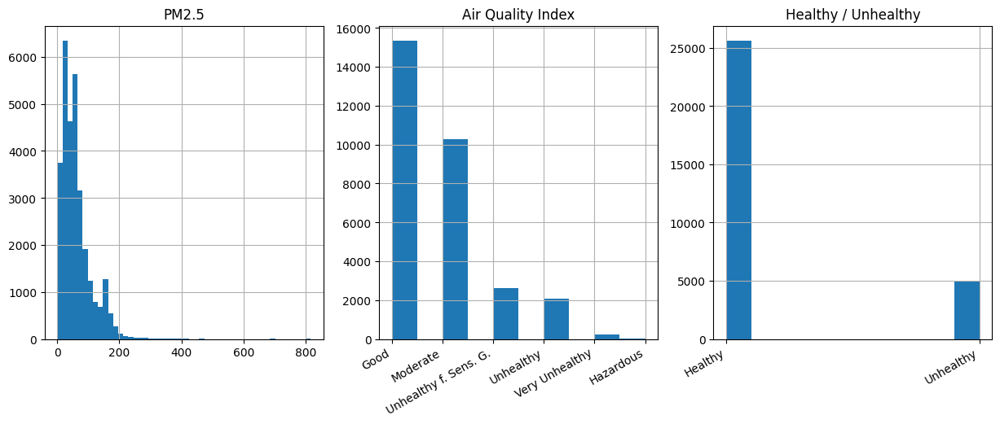

In [13]:
import matplotlib.pyplot as plt

fig_plt, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
fig_plt.patch.set_alpha(0.0)


df['target'].hist(ax=axes[0], bins=50)
axes[0].set_title('PM2.5')
df['target_aqi'].hist(ax=axes[1])
axes[1].set_title('Air Quality Index')
axes[1].set_xticks(ticks=axes[1].get_xticks(), labels=axes[1].get_xticklabels(), rotation=30, ha='right')
df['target_health'].hist(ax=axes[2])
axes[2].set_title('Healthy / Unhealthy')
axes[2].set_xticks(ticks=axes[2].get_xticks(), labels=axes[2].get_xticklabels(), rotation=30, ha='right')

In [6]:
import plotly.express as px

df.sort_values('target_variance')
fig = px.line(df, x='Date', y='target', color='Place_ID')
fig.update(layout_yaxis_range=[0, df['target'].max()])
fig.update_layout(legend_traceorder='reversed')
fig.update_layout(dict(updatemenus=[
                        dict(
                            type = "buttons",
                            direction = "left",
                            buttons=list([
                                dict(
                                    args=["visible", "legendonly"],
                                    label="Deselect All",
                                    method="restyle"
                                ),
                                dict(
                                    args=["visible", True],
                                    label="Select All",
                                    method="restyle"
                                )
                            ]),
                            pad={"r": 10, "t": 10},
                            showactive=False,
                            x=1,
                            xanchor="right",
                            y=1.1,
                            yanchor="top"
                        ),
                    ]
              ))
fig.show()


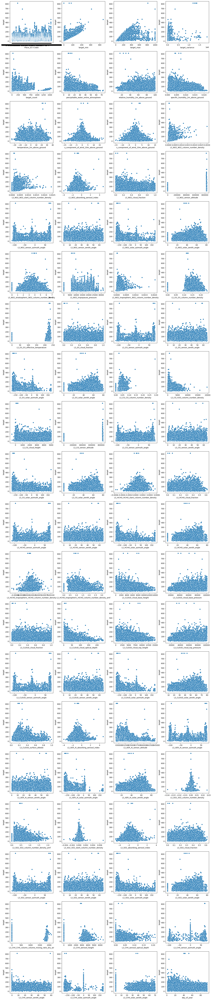

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

features = df.drop(['target', 'Place_ID', 'Date', 'target_aqi', 'target_health'], axis=1).columns

fig_sns, axes = plt.subplots(nrows=20, ncols=4, figsize=(20, 100))

for index, feature in enumerate(features):
    c, r = divmod(index, 4)
    sns.scatterplot(df, x=feature, y='target', ax=axes[c][r])



## Our selected Features

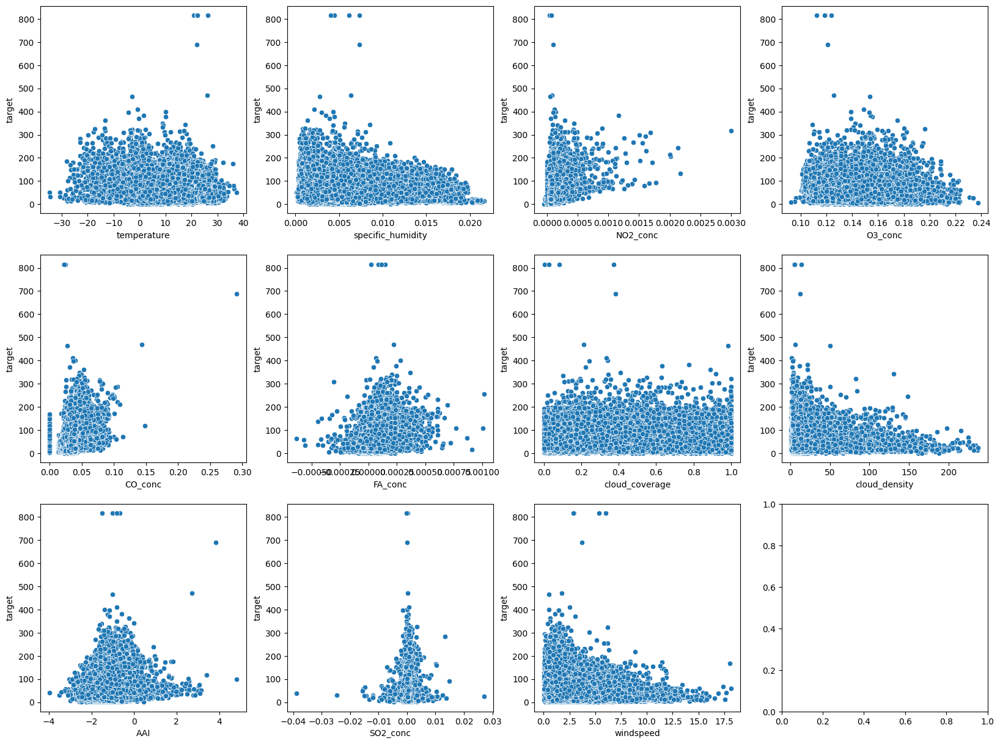

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

df_selected = uap.select_and_rename_columns(df, 'target')
features = df_selected.drop(['target', 'Place_ID'], axis=1).columns

fig_sns, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))

for index, feature in enumerate(features):
    c, r = divmod(index, 4)
    sns.scatterplot(df_selected, x=feature, y='target', ax=axes[c][r])
